# Inference code of **Diff-Instruct\*-SDXL-1step** text-to-image model

In [ ]:
!pip install diffusers==0.29.0 transformers accelerate

In [37]:
import torch
import numpy as np
from diffusers import DiffusionPipeline, UNet2DConditionModel, LCMScheduler
from huggingface_hub import hf_hub_download
from safetensors.torch import load_file

# MODEL_NAME = 'diff-instruct-star'
# MODEL_NAME = 'score-implicit-matching'
# MODEL_NAME = 'diff-instruct++'
# MODEL_NAME = 'diff-instruct'
# MODEL_NAME = 'dmd2'
# MODEL_NAME = 'sdxl'
# MODEL_NAME = 'sdxl-dpo'
# MODEL_NAME = 'diff-instruct-star-short'

def model_factory(model_name):

    if model_name == 'diff-instruct-star':
        pipe = DiffusionPipeline.from_pretrained("XDG-XHS/distar_long_1step", torch_dtype=torch.float16, variant="fp16").to("cuda")
        pipe.scheduler = LCMScheduler.from_config(pipe.scheduler.config)
        pipe_kwargs = {"num_inference_steps": 1, "guidance_scale": 0.0, "width": 1024, "height":1024, "timesteps": [399]}

    elif model_name == 'diff-instruct-star-short':
        pipe = DiffusionPipeline.from_pretrained("XDG-XHS/distar_long_1step", torch_dtype=torch.float16, variant="fp16").to("cuda")
        pipe.unet.load_state_dict(
            load_file(hf_hub_download(repo_id="XDG-XHS/distar_short_1step", 
                                      subfolder="unet", filename="diffusion_pytorch_model.fp16.safetensors")))
        pipe.scheduler = LCMScheduler.from_config(pipe.scheduler.config)
        pipe_kwargs = {"num_inference_steps": 1, "guidance_scale": 0.0, "width": 1024, "height":1024, "timesteps": [399]}

    elif model_name == 'score-implicit-matching':
        # load score-implicit-matching-1step model
        pipe = DiffusionPipeline.from_pretrained("/cpfs/user/weijian/logs/output_models/distar_r0_cfg7.5_inner_000256", torch_dtype=torch.float16, variant="fp16").to("cuda")
        pipe.unet.load_state_dict(
            load_file(hf_hub_download(repo_id="XDG-XHS/sim_1step", 
                                      subfolder="unet", filename="diffusion_pytorch_model.fp16.safetensors")))
        pipe.scheduler = LCMScheduler.from_config(pipe.scheduler.config)
        pipe_kwargs = {"num_inference_steps": 1, "guidance_scale": 0.0, "width": 1024, "height":1024, "timesteps": [399]}

    elif model_name == 'diff-instruct++':
        # load diff-instruct++-1step model
        pipe = DiffusionPipeline.from_pretrained("/cpfs/user/weijian/logs/output_models/dipp_r100_cfg7.5_inner_000256", torch_dtype=torch.float16, variant="fp16").to("cuda")
        pipe.unet.load_state_dict(
            load_file(hf_hub_download(repo_id="XDG-XHS/dipp_1step", 
                                      subfolder="unet", filename="diffusion_pytorch_model.fp16.safetensors")))
        pipe.scheduler = LCMScheduler.from_config(pipe.scheduler.config)
        pipe_kwargs = {"num_inference_steps": 1, "guidance_scale": 0.0, "width": 1024, "height":1024, "timesteps": [399]}

    elif model_name == 'diff-instruct':
        # load diff-instruct++-1step model
        pipe = DiffusionPipeline.from_pretrained("/cpfs/user/weijian/logs/output_models/dipp_r0_cfg7.5_inner_000256", torch_dtype=torch.float16, variant="fp16").to("cuda")
        pipe.unet.load_state_dict(
            load_file(hf_hub_download(repo_id="XDG-XHS/diff_instruct_1step", 
                                      subfolder="unet", filename="diffusion_pytorch_model.fp16.safetensors")))
        pipe.scheduler = LCMScheduler.from_config(pipe.scheduler.config)
        pipe_kwargs = {"num_inference_steps": 1, "guidance_scale": 0.0, "width": 1024, "height":1024, "timesteps": [399]}

    elif model_name == 'dmd2':
        # DMD2-1step model
        pipe = DiffusionPipeline.from_pretrained("XDG-XHS/distar_long_1step", torch_dtype=torch.float16, variant="fp16").to("cuda")
        pipe.unet.load_state_dict(
            load_file(hf_hub_download(repo_id="tianweiy/DMD2", 
                                      filename="dmd2_sdxl_1step_unet_fp16.bin")))
        pipe.scheduler = LCMScheduler.from_config(pipe.scheduler.config)
        pipe_kwargs = {"num_inference_steps": 1, "guidance_scale": 0.0, "width": 1024, "height":1024, "timesteps": [399]}

    elif model_name == 'sdxl':
        # SDXL
        pipe = DiffusionPipeline.from_pretrained("XDG-XHS/distar_long_1step", torch_dtype=torch.float16, variant="fp16").to("cuda")
        pipe.unet.load_state_dict(
            load_file(hf_hub_download(repo_id="stabilityai/stable-diffusion-xl-base-1.0",
                                      subfolder="unet", filename="diffusion_pytorch_model.fp16.safetensors")))        
        pipe_kwargs = {"num_inference_steps": 50, "guidance_scale": 7.5, "width": 1024, "height":1024}

    elif model_name == 'sdxl-dpo':
        # SDXL-dpo
        pipe = DiffusionPipeline.from_pretrained("XDG-XHS/distar_long_1step", torch_dtype=torch.float16, variant="fp16").to("cuda")
        pipe.unet.load_state_dict(
            load_file(hf_hub_download(repo_id="mhdang/dpo-sdxl-text2image-v1",
                                      subfolder="unet", filename="diffusion_pytorch_model.safetensors")))
        pipe.unet.to(torch.float16)
        pipe_kwargs = {"num_inference_steps": 50, "guidance_scale": 7.5, "width": 1024, "height":1024}

    else:
        raise NotImplementedError('MODEL_NAME {} not implemented.'.format(model_name))
        
    return pipe, pipe_kwargs
    

**evaluation prompts**: change to any prompts you like

In [3]:
# generator = torch.Generator("cuda").manual_seed(2024)

# prompts = 'a volcano exploding next to a marina'
# prompts = 'a shiba inu'
# prompts = 'the skyline of New York City'
# prompts = 'a pirate ship flying in the sky, surrounded by clouds'
# prompts = 'a giant red dragon breathing fire'
# prompts = 'an armchair'
# prompts = 'Dreamy puppy surrounded by floating bubbles.'
# prompts = 'waterfall'
# prompts = 'A alpaca made of colorful building blocks, cyberpunk.'
# prompts = 'a tiger'
# prompts = 'a teapot'
# prompts = 'baby playing with toys in the snow'
# prompts = 'a bear sculpture'
# prompts = 'a delicate apple (universe of stars inside the apple) made of opal hung on branch in the early morning light, adorned with glistening dewdrops. In the background beautiful valleys, divine iridescent glowing, opalescent textures, volumetric light, ethereal, sparkling, light inside body, bioluminescence, studio photo, highly detailed, sharp focus, photorealism, photorealism, 8k, best quality, ultra detail, hyper detail, hdr, hyper detail.'
# prompts = 'a small cactus with a happy face in the Sahara desert.'
# prompts = 'a stylish woman posing confidently with oversized sunglasses.'
# prompts = 'A close-up of a woman’s face, lit by the soft glow of a neon sign in a dimly lit, retro diner, hinting at a narrative of longing and nostalgia'
# prompts = 'A stylish woman walks down a Tokyo street filled with warm glowing neon and animated city signage. She wears a black leather jacket, a long red dress, and black boots, and carries a black purse. She wears sunglasses and red lipstick. She walks confidently and casually. The street is damp and reflective, creating a mirror effect of the colorful lights. Many pedestrians walk about.'
# prompts = 'steampunk atmosphere, a stunning girl with a mecha musume aesthetic, adorned in intricate cyber gogle, digital art, fractal, 32k UHD high resolution, highres, professional photography, intricate details, masterpiece, perfect anatomy, cinematic angle , cinematic lighting, (dynamic warrior pose:1)'
# prompts = 'a steam locomotive speeding through a desert'

# prompts = ['a volcano exploding next to a marina',
#            'the skyline of New York City',
#            'a pirate ship flying in the sky, surrounded by clouds',
#            'a giant red dragon breathing fire',
#            'an armchair',
#            'A alpaca made of colorful building blocks, cyberpunk']

prompts = ['art collection style and fashion shoot, in the style of made of glass, dark blue and light pink, paul rand, solarpunk, camille vivier, beth didonato hair, barbiecore, hyper-realistic.',
           'A dog that has been meditating all the time.',
           'a capybara made of voxels sitting in a field',
           'Eiffel tower in a forest, and Mount Everest rising behind',
           'a steam locomotive speeding through a desert',
           'a shiba inu']
    

### **Generate with Diff-Instruct-Star: 1 step**

https://arxiv.org/abs/2410.20898

Loading pipeline components...: 100%|██████████| 7/7 [00:01<00:00,  3.56it/s]
The config attributes {'interpolation_type': 'linear', 'skip_prk_steps': True, 'use_karras_sigmas': False} were passed to LCMScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.
The first timestep on the custom timestep schedule is 399, not `self.config.num_train_timesteps - 1`: 999. You may get unexpected results when using this timestep schedule.
100%|██████████| 1/1 [00:00<00:00,  6.69it/s]


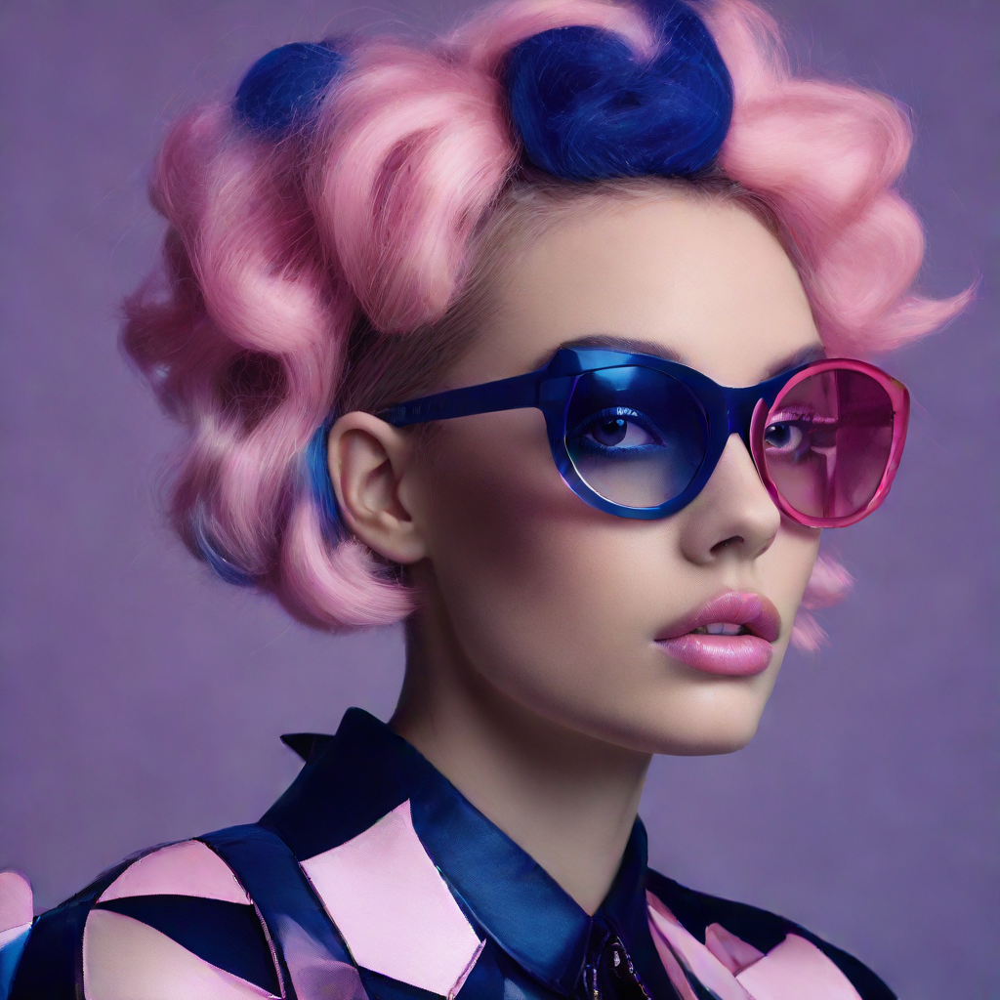

In [28]:
generator = torch.Generator("cuda").manual_seed(2024)

pipe, pipe_kwargs = model_factory(model_name='diff-instruct-star')

prompts = ['art collection style and fashion shoot, in the style of made of glass, dark blue and light pink, paul rand, solarpunk, camille vivier, beth didonato hair, barbiecore, hyper-realistic.',
           'A dog that has been meditating all the time.',
           'a capybara made of voxels sitting in a field',
           'Eiffel tower in a forest, and Mount Everest rising behind',
           'a steam locomotive speeding through a desert',
           'a shiba inu']

with torch.no_grad():
    images = pipe(prompt=prompts, generator=generator, **pipe_kwargs).images

# for i,image in enumerate(images):
#     image.save("save/output_image_{}.png".format(i))  # save images

images[0].show()  # show the last image

### Generate with SDXL-DPO: 50 steps
https://arxiv.org/abs/2311.12908

100%|██████████| 50/50 [00:14<00:00,  3.45it/s]


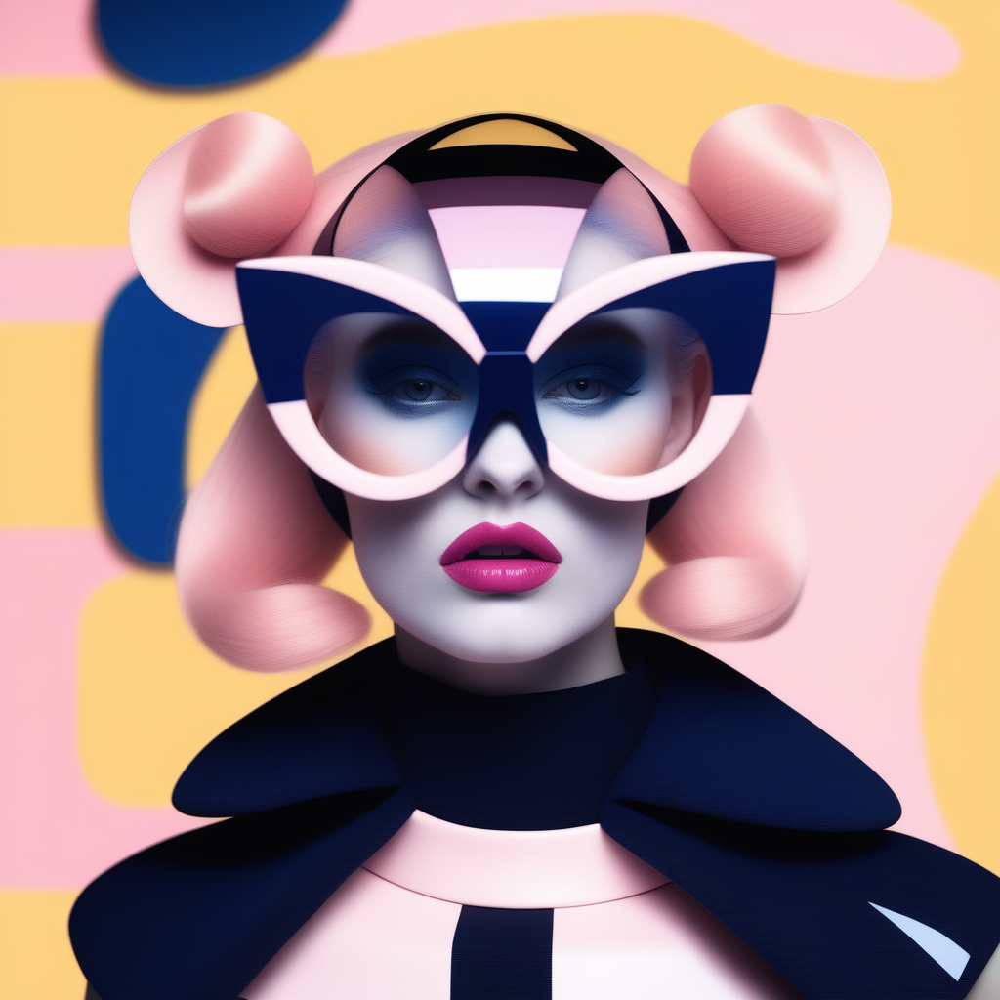

In [38]:
generator = torch.Generator("cuda").manual_seed(2024)

pipe, pipe_kwargs = model_factory(model_name='sdxl-dpo')

prompts = ['art collection style and fashion shoot, in the style of made of glass, dark blue and light pink, paul rand, solarpunk, camille vivier, beth didonato hair, barbiecore, hyper-realistic.',
           'A dog that has been meditating all the time.',
           'a capybara made of voxels sitting in a field',
           'Eiffel tower in a forest, and Mount Everest rising behind',
           'a steam locomotive speeding through a desert',
           'a shiba inu']

with torch.no_grad():
    images = pipe(prompt=prompts, generator=generator, **pipe_kwargs).images

# for i,image in enumerate(images):
#     image.save("save/output_image_{}.png".format(i))  # save images

images[0].show()  # show the last image

### Generate with SDXL: 50 steps
https://arxiv.org/abs/2307.01952

100%|██████████| 50/50 [00:14<00:00,  3.44it/s]


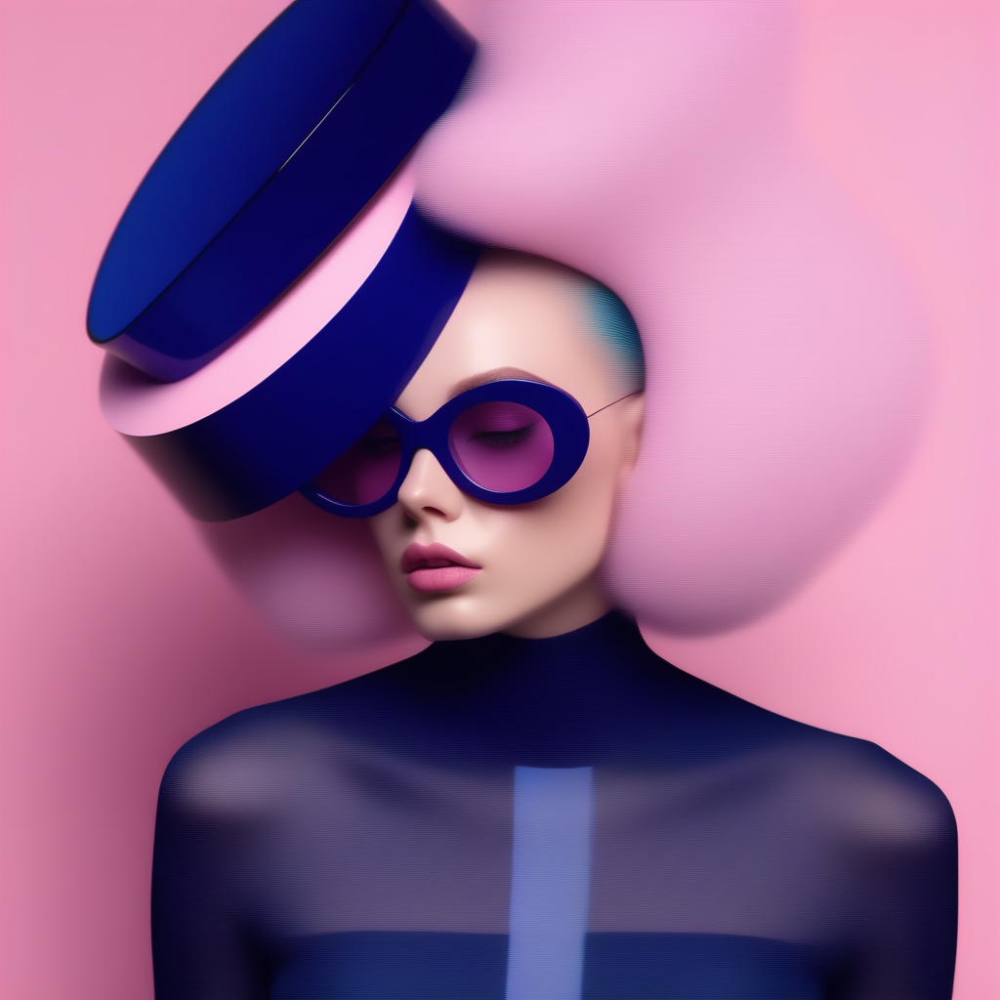

In [39]:
generator = torch.Generator("cuda").manual_seed(2024)

pipe, pipe_kwargs = model_factory(model_name='sdxl')

prompts = ['art collection style and fashion shoot, in the style of made of glass, dark blue and light pink, paul rand, solarpunk, camille vivier, beth didonato hair, barbiecore, hyper-realistic.',
           'A dog that has been meditating all the time.',
           'a capybara made of voxels sitting in a field',
           'Eiffel tower in a forest, and Mount Everest rising behind',
           'a steam locomotive speeding through a desert',
           'a shiba inu']

with torch.no_grad():
    images = pipe(prompt=prompts, generator=generator, **pipe_kwargs).images

# for i,image in enumerate(images):
#     image.save("save/output_image_{}.png".format(i))  # save images

images[0].show()  # show the last image

### Generate with DMD2: 1 step
https://arxiv.org/abs/2405.14867

/usr/local/lib/python3.11/dist-packages/diffusers/configuration_utils.py:245: FutureWarning: It is deprecated to pass a pretrained model name or path to `from_config`.If you were trying to load a model, please use <class 'diffusers.models.unets.unet_2d_condition.UNet2DConditionModel'>.load_config(...) followed by <class 'diffusers.models.unets.unet_2d_condition.UNet2DConditionModel'>.from_config(...) instead. Otherwise, please make sure to pass a configuration dictionary instead. This functionality will be removed in v1.0.0.
  deprecate("config-passed-as-path", "1.0.0", deprecation_message, standard_warn=False)
Loading pipeline components...: 100%|██████████| 7/7 [00:01<00:00,  4.46it/s]
The config attributes {'skip_prk_steps': True} were passed to LCMScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.
The first timestep on the custom timestep schedule is 399, not `self.config.num_train_timesteps - 1`: 999. You may get unexp

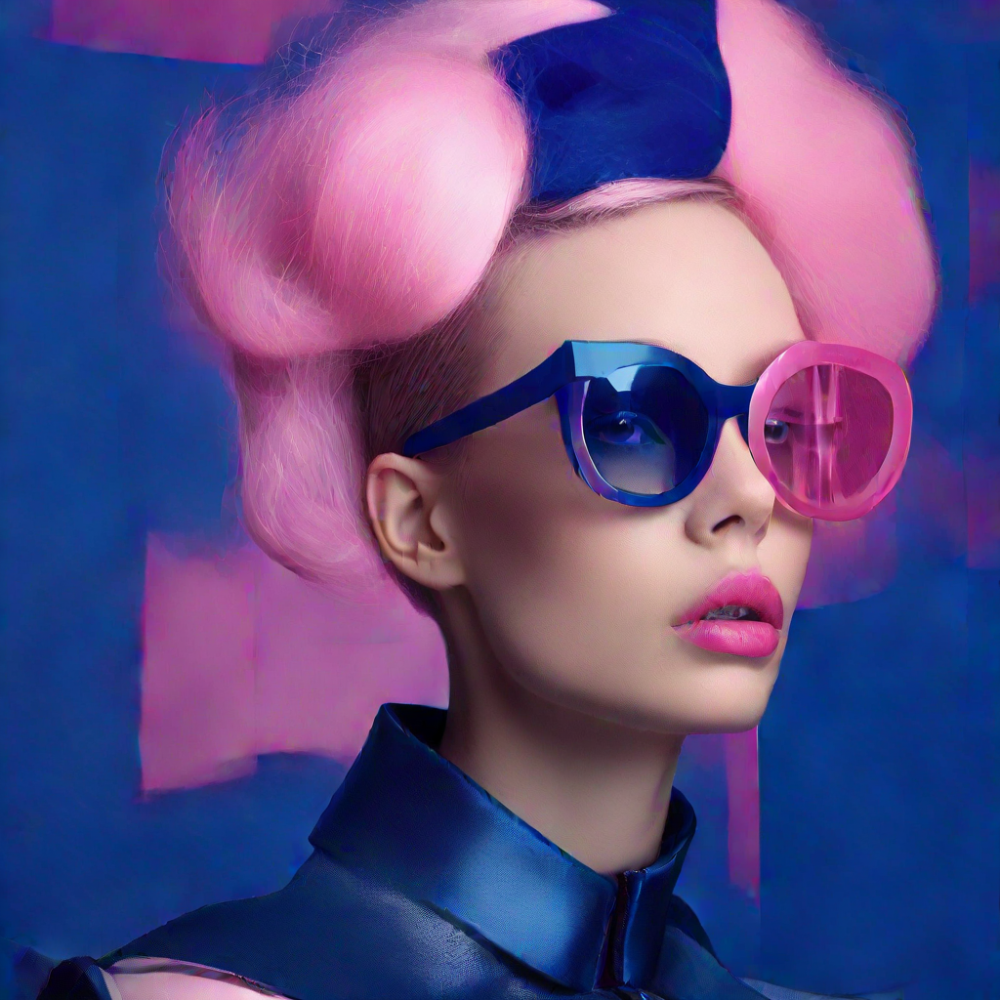

In [43]:
generator = torch.Generator("cuda").manual_seed(2024)

pipe, pipe_kwargs = model_factory(model_name='dmd2')

prompts = ['art collection style and fashion shoot, in the style of made of glass, dark blue and light pink, paul rand, solarpunk, camille vivier, beth didonato hair, barbiecore, hyper-realistic.',
           'A dog that has been meditating all the time.',
           'a capybara made of voxels sitting in a field',
           'Eiffel tower in a forest, and Mount Everest rising behind',
           'a steam locomotive speeding through a desert',
           'a shiba inu']

with torch.no_grad():
    images = pipe(prompt=prompts, generator=generator, **pipe_kwargs).images

# for i,image in enumerate(images):
#     image.save("save/output_image_{}.png".format(i))  # save images

images[0].show()  # show the last image

# Other Models

### Generate with Score Implicit Matching: 1 step
https://arxiv.org/abs/2410.16794

Loading pipeline components...: 100%|██████████| 7/7 [00:02<00:00,  2.88it/s]
The config attributes {'interpolation_type': 'linear', 'skip_prk_steps': True, 'use_karras_sigmas': False} were passed to LCMScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.
The first timestep on the custom timestep schedule is 399, not `self.config.num_train_timesteps - 1`: 999. You may get unexpected results when using this timestep schedule.
100%|██████████| 1/1 [00:00<00:00,  6.68it/s]


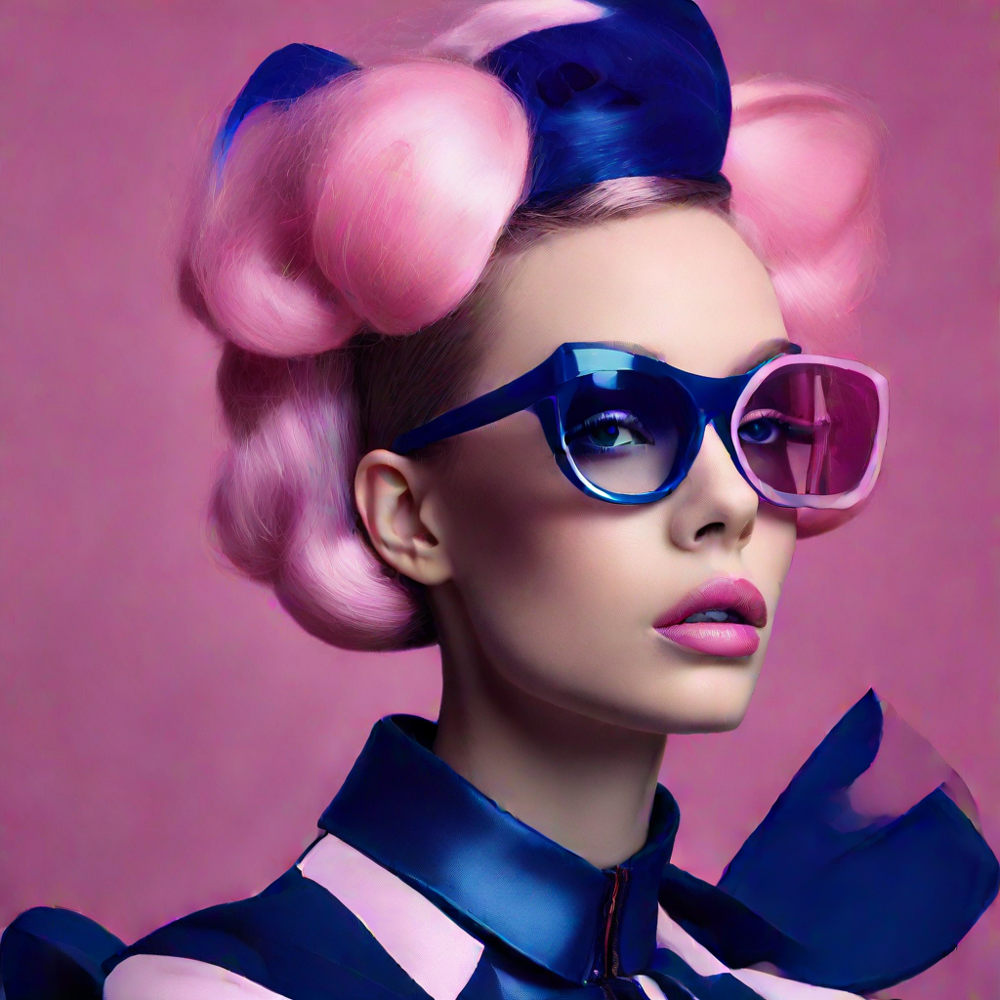

In [40]:
generator = torch.Generator("cuda").manual_seed(2024)

pipe, pipe_kwargs = model_factory(model_name='score-implicit-matching')

prompts = ['art collection style and fashion shoot, in the style of made of glass, dark blue and light pink, paul rand, solarpunk, camille vivier, beth didonato hair, barbiecore, hyper-realistic.',
           'A dog that has been meditating all the time.',
           'a capybara made of voxels sitting in a field',
           'Eiffel tower in a forest, and Mount Everest rising behind',
           'a steam locomotive speeding through a desert',
           'a shiba inu']

with torch.no_grad():
    images = pipe(prompt=prompts, generator=generator, **pipe_kwargs).images

# for i,image in enumerate(images):
#     image.save("save/output_image_{}.png".format(i))  # save images

images[0].show()  # show the last image

### Generate with Diff-Instruct++: 1 step
https://arxiv.org/abs/2410.18881

Loading pipeline components...: 100%|██████████| 7/7 [00:01<00:00,  3.74it/s]
The config attributes {'interpolation_type': 'linear', 'skip_prk_steps': True, 'use_karras_sigmas': False} were passed to LCMScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.
The first timestep on the custom timestep schedule is 399, not `self.config.num_train_timesteps - 1`: 999. You may get unexpected results when using this timestep schedule.
100%|██████████| 1/1 [00:00<00:00,  6.69it/s]


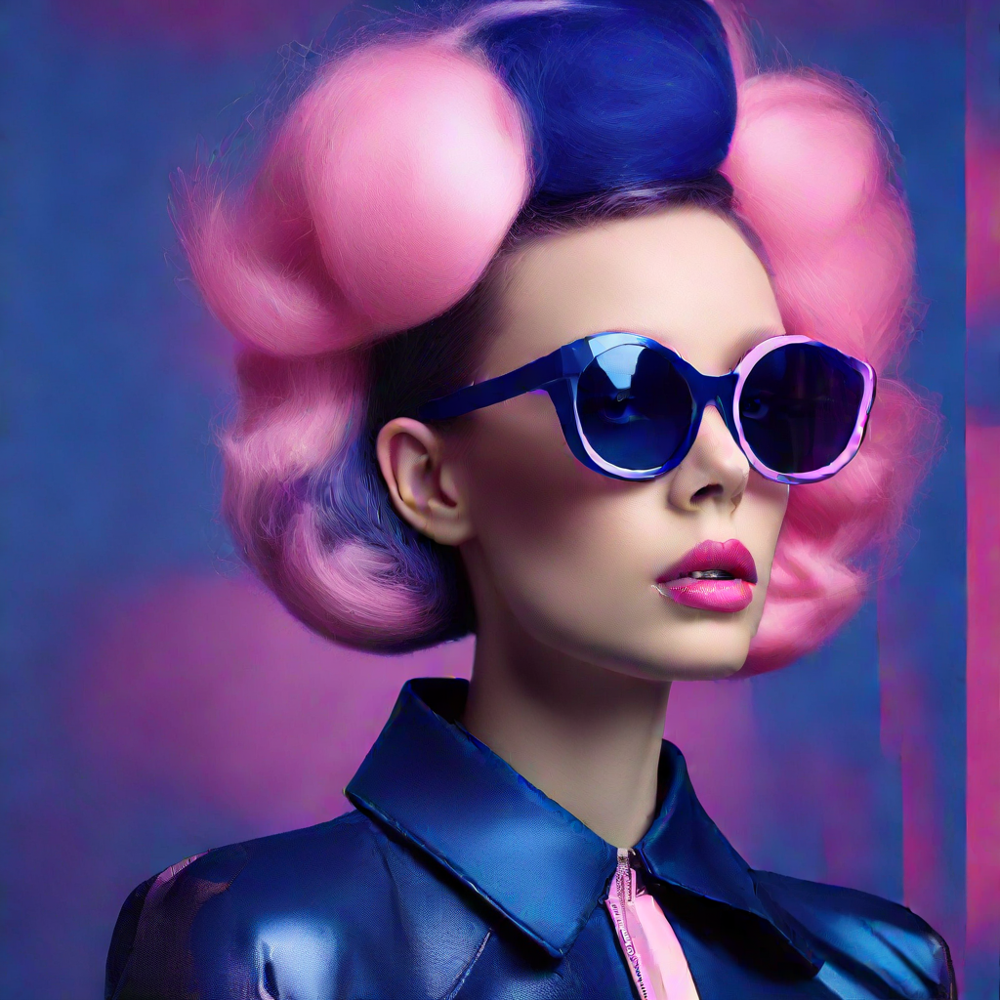

In [41]:
generator = torch.Generator("cuda").manual_seed(2024)

pipe, pipe_kwargs = model_factory(model_name='diff-instruct++')

prompts = ['art collection style and fashion shoot, in the style of made of glass, dark blue and light pink, paul rand, solarpunk, camille vivier, beth didonato hair, barbiecore, hyper-realistic.',
           'A dog that has been meditating all the time.',
           'a capybara made of voxels sitting in a field',
           'Eiffel tower in a forest, and Mount Everest rising behind',
           'a steam locomotive speeding through a desert',
           'a shiba inu']

with torch.no_grad():
    images = pipe(prompt=prompts, generator=generator, **pipe_kwargs).images

# for i,image in enumerate(images):
#     image.save("save/output_image_{}.png".format(i))  # save images

images[0].show()  # show the last image

### Generate with Diff-Instruct: 1 step
https://arxiv.org/abs/2305.18455

Loading pipeline components...: 100%|██████████| 7/7 [00:01<00:00,  3.67it/s]
The config attributes {'interpolation_type': 'linear', 'skip_prk_steps': True, 'use_karras_sigmas': False} were passed to LCMScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.
The first timestep on the custom timestep schedule is 399, not `self.config.num_train_timesteps - 1`: 999. You may get unexpected results when using this timestep schedule.
100%|██████████| 1/1 [00:00<00:00,  6.67it/s]


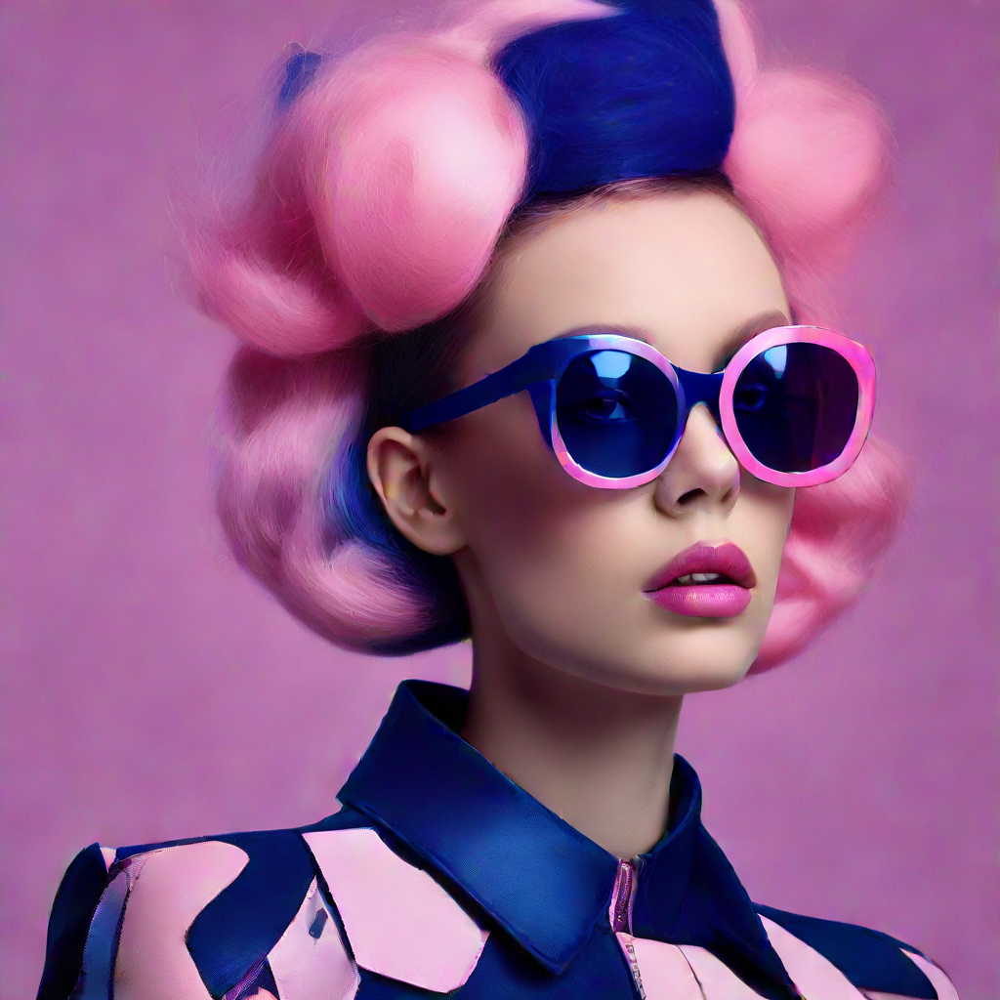

In [42]:
generator = torch.Generator("cuda").manual_seed(2024)

pipe, pipe_kwargs = model_factory(model_name='diff-instruct')

prompts = ['art collection style and fashion shoot, in the style of made of glass, dark blue and light pink, paul rand, solarpunk, camille vivier, beth didonato hair, barbiecore, hyper-realistic.',
           'A dog that has been meditating all the time.',
           'a capybara made of voxels sitting in a field',
           'Eiffel tower in a forest, and Mount Everest rising behind',
           'a steam locomotive speeding through a desert',
           'a shiba inu']

with torch.no_grad():
    images = pipe(prompt=prompts, generator=generator, **pipe_kwargs).images

# for i,image in enumerate(images):
#     image.save("save/output_image_{}.png".format(i))  # save images

images[0].show()  # show the last image

### **If you find Diff-Instruct\* or Diff-Instruct family useful, please cite our papers:**